# GW Response Tutorial Notebook

In [1]:
import os
import sys
import gw_response as gwr

print("Running on:", sys.version)

os.mkdir("tutorial_LISA_output") if not os.path.exists("tutorial_LISA_output") else None

Running on: 3.13.5 (main, Aug 22 2025, 14:32:32) [GCC 15.2.1 20250813]


In [2]:
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import jax_healpy as jhp
import warnings


from pathlib import Path
from IPython.display import Image, display
import matplotlib.animation as animation

warnings.filterwarnings("ignore")

GENERATE_TEST_DATA = False

## Module: `constants`

Contains dataclasses for standard physical constants and TDI basis transformations

In [3]:
ps = gwr.PhysicalConstants()
print("Object:", ps)
print("Example (c in m/s):", ps.light_speed)

Object: PhysicalConstants(light_speed=299792458.0, hour=3600.0, day=86400.0, yr=31557600.0, sidereal_day=86164.0905, Hubble_over_h=3.24e-18, AU=149597870700.0, cmb_dipole=Array([-0.972,  0.137, -0.191], dtype=float64))
Example (c in m/s): 299792458.0


In [4]:
basis_transformation = gwr.BasisTransformations()
# Currently only XYZ to AET implemented
print("Object:", basis_transformation)
print("Example (XYZ to AET):\n", basis_transformation.XYZ_to_AET)

Object: BasisTransformations(XYZ_to_AET=Array([[-0.70710678,  0.        ,  0.70710678],
       [ 0.40824829, -0.81649658,  0.40824829],
       [ 0.57735027,  0.57735027,  0.57735027]], dtype=float64))
Example (XYZ to AET):
 [[-0.70710678  0.          0.70710678]
 [ 0.40824829 -0.81649658  0.40824829]
 [ 0.57735027  0.57735027  0.57735027]]


## Module `utils`

Implements a few helper functions relevant to e.g. the pixelisation of the sky and computing complex exponentials

In [5]:
# Pixel class
pixel_class = gwr.Pixel(NSIDE=8)
print("Number of pixels:", pixel_class.NPIX)
print("theta shape:", pixel_class.theta_pixel.shape)
print("phi shape:", pixel_class.phi_pixel.shape)
print("angular map shape:", pixel_class.angular_map.shape)

theta = pixel_class.theta_pixel
phi = pixel_class.phi_pixel

Number of pixels: 768
theta shape: (768,)
phi shape: (768,)
angular map shape: (768, 2)


Some aux variables for the mollweide plots

In [6]:
# Build a regular longitude/latitude grid for the Mollweide projection.
lon_vals = np.linspace(-np.pi, np.pi, 300)
lat_vals = np.linspace(-np.pi / 2.0, np.pi / 2.0, 200)
lon_grid, lat_grid = np.meshgrid(lon_vals, lat_vals)
theta_grid = np.pi / 2.0 - lat_grid
phi_grid = lon_grid

A first example plot with some angular variables

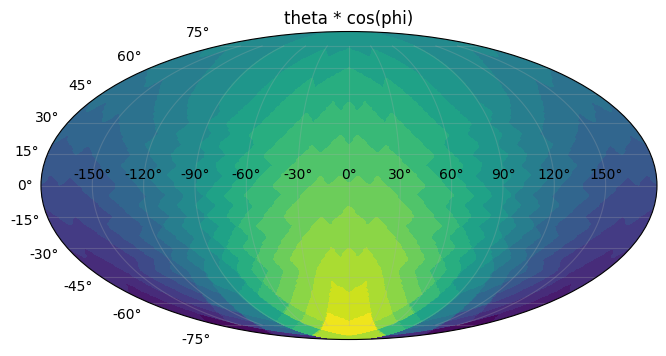

In [7]:
fig, ax = plt.subplots(
    1,
    figsize=(8, 4),
    subplot_kw={"projection": "mollweide"},
)

pix_grid = np.asarray(
    jhp.ang2pix(pixel_class.NSIDE, theta_grid.ravel(), phi_grid.ravel()),
    dtype=int,
).reshape(theta_grid.shape)

to_plot = (theta * jnp.cos(phi))[pix_grid]

ax.contourf(lon_grid, lat_grid, to_plot, levels=20, cmap="viridis")
ax.set_title("theta * cos(phi)")
ax.grid(True, alpha=0.25)

if GENERATE_TEST_DATA:
    np.save("../testing/test_data/pixel_theta.npy", np.array(theta))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/pixel_phi.npy", np.array(phi))
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/pixel_angular_map.npy",
        np.array(pixel_class.angular_map),
    )

## Module: `detector`

Contains an abstract base class implementation of a `Detector` object

In [8]:
class MyDetector(gwr.Detector):
    # These properties and class functions must be implemented, other functionality is optional
    name = "MyDetector"
    fmin = 10.0  # Hz
    fmax = 1024.0  # Hz
    armlength = 4.0  # km
    res = 0.25  # Hz

    def vertex_positions(self):
        return jnp.array(
            [
                [0.0, 0.0, 0.0],
                [0.0, 0.0, self.armlength],
                [0.0, self.armlength, 0.0],
            ]
        )

    def detector_arms(self):
        return jnp.array(
            [
                [0.0, 0.0, self.armlength],
                [0.0, self.armlength, -self.armlength],
                [0.0, -self.armlength, 0.0],
                [0.0, 0.0, -self.armlength],
                [0.0, -self.armlength, self.armlength],
                [0.0, self.armlength, 0.0],
            ]
        )

## Module: `lisa`

Implementation of the LISA detector class and various helper functions for this

lisa_analytical_x_positions shape: (100,) [time]
lisa_analytical_y_positions shape: (100,) [time]
lisa_analytical_z_positions shape: (100,) [time]


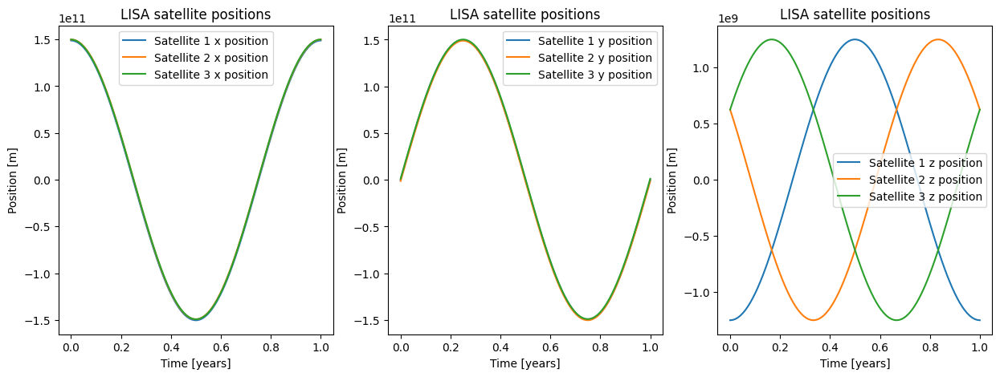

In [9]:
# Satellite positions
time_in_years = jnp.linspace(0, 1.0, 100)

fig = plt.figure(figsize=(15, 5))
for satellite in [1, 2, 3]:
    ax = plt.subplot(1, 3, 1)
    lisa_analytical_x_positions = gwr.LISA_satellite_x_coordinate_analytical(
        index=satellite,
        time_in_years=time_in_years,
        orbit_radius=gwr.PhysicalConstants().AU,
        eccentricity=gwr.LISA().ecc,
    )
    if satellite == 1:
        print(
            "lisa_analytical_x_positions shape:",
            lisa_analytical_x_positions.shape,
            "[time]",
        )
        if GENERATE_TEST_DATA:
            np.save(
                "../testing/test_data/lisa_analytical_x_positions.npy",
                np.array(lisa_analytical_x_positions),
            )
    plt.plot(
        time_in_years,
        lisa_analytical_x_positions,
        label=f"Satellite {satellite} x position",
    )
    ax = plt.subplot(1, 3, 2)
    lisa_analytical_y_positions = gwr.LISA_satellite_y_coordinate_analytical(
        index=satellite,
        time_in_years=time_in_years,
        orbit_radius=gwr.PhysicalConstants().AU,
        eccentricity=gwr.LISA().ecc,
    )
    if satellite == 1:
        print(
            "lisa_analytical_y_positions shape:",
            lisa_analytical_y_positions.shape,
            "[time]",
        )
        if GENERATE_TEST_DATA:
            np.save(
                "../testing/test_data/lisa_analytical_y_positions.npy",
                np.array(lisa_analytical_y_positions),
            )
    plt.plot(
        time_in_years,
        lisa_analytical_y_positions,
        label=f"Satellite {satellite} y position",
    )
    ax = plt.subplot(1, 3, 3)
    lisa_analytical_z_positions = gwr.LISA_satellite_z_coordinate_analytical(
        index=satellite,
        time_in_years=time_in_years,
        orbit_radius=gwr.PhysicalConstants().AU,
        eccentricity=gwr.LISA().ecc,
    )
    if satellite == 1:
        print(
            "lisa_analytical_z_positions shape:",
            lisa_analytical_z_positions.shape,
            "[time]",
        )
        if GENERATE_TEST_DATA:
            np.save(
                "../testing/test_data/lisa_analytical_z_positions.npy",
                np.array(lisa_analytical_z_positions),
            )
    plt.plot(
        time_in_years,
        lisa_analytical_z_positions,
        label=f"Satellite {satellite} z position",
    )
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.xlabel("Time [years]")
    plt.ylabel("Position [m]")
    plt.title("LISA satellite positions")
    plt.legend()

Use the analytical orbits to get the positions of the satellites

In [10]:
# x, y, z positions can also be accessed at once
lisa_analytical_positions = gwr.LISA_satellite_coordinates_analytical(
    index=1,
    time_in_years=time_in_years,
    orbit_radius=gwr.PhysicalConstants().AU,
    eccentricity=gwr.LISA().ecc,
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/lisa_analytical_positions_sat_1.npy",
        np.array(lisa_analytical_positions),
    )
print(
    "LISA satellite positions shape:",
    lisa_analytical_positions.shape,
    "[vector, time]",
)

LISA satellite positions shape: (3, 100) [vector, time]


With the vmap it also works on Arrays

LISA satellite positions shape: (3, 3, 100) [satellite, vector, time]


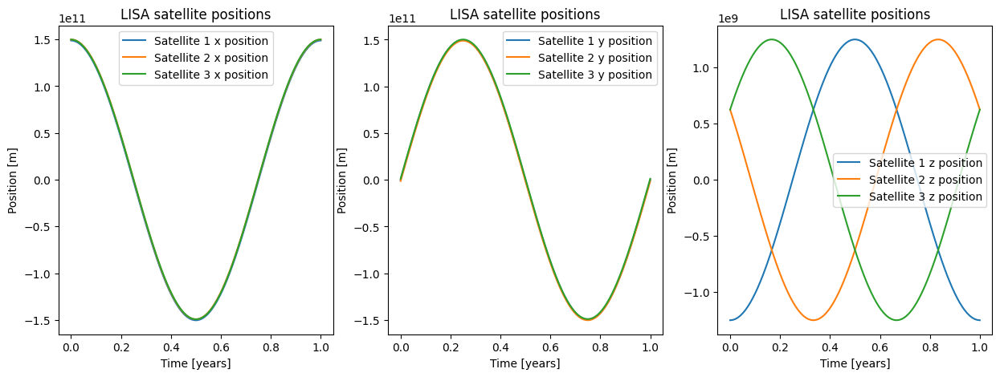

In [11]:
# or for all satellites at once
lisa_analytical_positions = gwr.LISA_satellite_coordinates_analytical_vm(
    jnp.array([1, 2, 3]),
    time_in_years,
    gwr.PhysicalConstants().AU,
    gwr.LISA().ecc,
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/lisa_analytical_positions_vm.npy",
        np.array(lisa_analytical_positions),
    )
print(
    "LISA satellite positions shape:",
    lisa_analytical_positions.shape,
    "[satellite, vector, time]",
)
fig = plt.figure(figsize=(15, 5))
for satellite_idx in [0, 1, 2]:
    ax = plt.subplot(1, 3, 1)
    plt.plot(
        time_in_years,
        lisa_analytical_positions[satellite_idx, 0, :],
        label=f"Satellite {satellite_idx + 1} x position",
    )
    ax = plt.subplot(1, 3, 2)
    plt.plot(
        time_in_years,
        lisa_analytical_positions[satellite_idx, 1, :],
        label=f"Satellite {satellite_idx + 1} y position",
    )
    ax = plt.subplot(1, 3, 3)
    plt.plot(
        time_in_years,
        lisa_analytical_positions[satellite_idx, 2, :],
        label=f"Satellite {satellite_idx + 1} z position",
    )
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.xlabel("Time [years]")
    plt.ylabel("Position [m]")
    plt.title("LISA satellite positions")
    plt.legend()

High level entry point

In [12]:
# Can also be accessed with LISA_satellite_positions
lisa_analytical_positions = gwr.LISA_satellite_positions(
    time_in_years,
    gwr.PhysicalConstants().AU,
    eccentricity=gwr.LISA().ecc,
    orbit_approximant="rigid",  # "rigid", "keplerian", or "numeric" are available
)
print(
    "LISA satellite positions shape:",
    lisa_analytical_positions.shape,
    "[time, vector, satellite]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/lisa_satellite_positions.npy",
        np.array(lisa_analytical_positions),
    )

LISA satellite positions shape: (100, 3, 3) [time, vector, satellite]


Same thing for the arms of the detector

LISA arms matrix shape: (100, 3, 6)


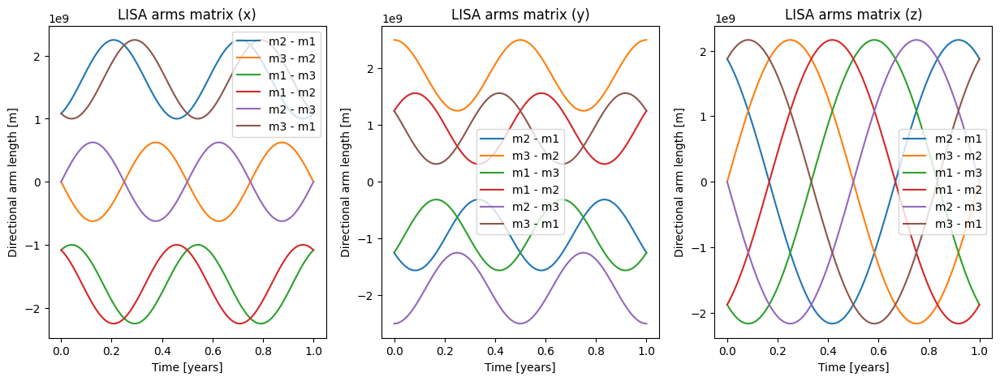

In [13]:
# Computing the unnormalised arms matrix
lisa_arms_matrix = gwr.LISA_arms_matrix_analytical(
    time_in_years, gwr.PhysicalConstants().AU, eccentricity=gwr.LISA().ecc
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/lisa_arms_matrix_analytical.npy",
        np.array(lisa_arms_matrix),
    )
print(
    "LISA arms matrix shape:", lisa_arms_matrix.shape
), "[time, xyz, arms]"  # [sat2 - sat1, sat3 - sat2, sat1 - sat3, sat1 - sat2, sat2 - sat3, sat3 - sat1]
fig = plt.figure(figsize=(15, 5))
labels = ["m2 - m1", "m3 - m2", "m1 - m3", "m1 - m2", "m2 - m3", "m3 - m1"]
titles = ["x", "y", "z"]
for i in range(3):
    ax = plt.subplot(1, 3, i + 1)
    for j in range(6):
        plt.plot(time_in_years, lisa_arms_matrix[:, i, j], label=labels[j])
    plt.legend()
    plt.xlabel("Time [years]")
    plt.ylabel("Directional arm length [m]")
    plt.title("LISA arms matrix (" + titles[i] + ")")

Check that the armlengths are what they are supposed to be

In [14]:
arm_lengths = jnp.sqrt(jnp.einsum("tij,tij->tj", lisa_arms_matrix, lisa_arms_matrix))
print("Arm lengths:", arm_lengths[0, :])
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/arm_lengths.npy", np.array(arm_lengths))

Arm lengths: [2.5e+09 2.5e+09 2.5e+09 2.5e+09 2.5e+09 2.5e+09]


In [15]:
# LISA detector object available to access all these properties
lisa = gwr.LISA()
print("LISA object:", lisa)
# Generate a given frequency grid between lisa.fmin and lisa.fmax
frequencies = lisa.frequency_vec(10)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/frequencies.npy", np.array(frequencies))
print("Frequencies:\n", frequencies)

# Compute the corresponding k vector (f * arm_length / c)
kl_vector = lisa.klvector(frequencies)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/kl_vector.npy", np.array(kl_vector))
print("kl vector:\n", kl_vector)

# or the corresponding x vector (2 pi f L / c) for a given frequency grid
x_vector = lisa.x(frequencies)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/x_vector.npy", np.array(x_vector))
print("x vector:\n", x_vector)

# Easily access satellite positions and detector arms matrix
vertex_positions = lisa.vertex_positions(time_in_years)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/satellite_positions.npy",
        np.array(vertex_positions),
    )
print("Vertex positions shape:", vertex_positions.shape)
arms_matrix = lisa.detector_arms(time_in_years)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/arms_matrix.npy", np.array(arms_matrix))
print("Arms matrix shape:", arms_matrix.shape)

LISA object: LISA(name='LISA', ps=PhysicalConstants(light_speed=299792458.0, hour=3600.0, day=86400.0, yr=31557600.0, sidereal_day=86164.0905, Hubble_over_h=3.24e-18, AU=149597870700.0, cmb_dipole=Array([-0.972,  0.137, -0.191], dtype=float64)), fmin=3e-05, fmax=0.5, armlength=2500000000.0, deg=20, res=1e-06, orbit_approximant='rigid', orbit_file=None, orbit_interpolation_method='linear', keplerian_tilt_parameter=0.625, keplerian_initial_clocking_angle=0.0, keplerian_chirality=1.0, default_combination='XYZ', response=Response(ps=PhysicalConstants(light_speed=299792458.0, hour=3600.0, day=86400.0, yr=31557600.0, sidereal_day=86164.0905, Hubble_over_h=3.24e-18, AU=149597870700.0, cmb_dipole=Array([-0.972,  0.137, -0.191], dtype=float64)), waveform=None, single_link_response={}, linear_integrand={}, quadratic_integrand={}, quadratic_integrated={}), noise=Noise(ps=PhysicalConstants(light_speed=299792458.0, hour=3600.0, day=86400.0, yr=31557600.0, sidereal_day=86164.0905, Hubble_over_h=3.24

Now that the detector exists we can easily cchange refrence frame

In [16]:
sat_positions = lisa.vertex_positions(0.0)[0]
p1, p2, p3 = sat_positions[:, 0], sat_positions[:, 1], sat_positions[:, 2]

# Or shift a set of positions to the centre
sp1, sp2, sp3 = gwr.shift_to_center(p1, p2, p3)

print("New centre of mass (~[0, 0, 0]):", sp1 + sp2 + sp3)

New centre of mass (~[0, 0, 0]): [-5.60283661e-06  2.38418579e-07  1.19209290e-07]


In [17]:
# Define a new denser frequency grid for the following computations
freqs = jnp.logspace(-5, 0, 300)

# Some helper functions to compute e.g. the arms length exponential
arm_length_exp = gwr.arm_length_exponential(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("arm_length_exp shape:", arm_length_exp.shape, "[time, freq, arms]")
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/arm_length_exp.npy", np.array(arm_length_exp))

arm_length_exp shape: (1, 300, 6) [time, freq, arms]


## Module: `tdi`

Implements relevant functions for computing the TDI basis transformations

In [18]:
# Sine factors
sine_factors = gwr.sin_factors(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/sine_factors.npy", np.array(sine_factors))
print("sine_factors shape:", sine_factors.shape, "[time, freq, arms]")

sine_factors shape: (1, 300, 6) [time, freq, arms]


In [19]:
# Or the various TDI matrices
tdi_XYZ = gwr.tdi_XYZ_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_XYZ shape:", tdi_XYZ.shape, "[time, freq, tdi, arms]")

tdi_AET = gwr.tdi_AET_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_AET shape:", tdi_AET.shape, "[time, freq, tdi, arms]")

tdi_Sagnac = gwr.tdi_Sagnac_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_Sagnac shape:", tdi_Sagnac.shape, "[time, freq, tdi, arms]")

tdi_AET_Sagnac = gwr.tdi_AET_Sagnac_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_AET_Sagnac shape:", tdi_AET_Sagnac.shape, "[time, freq, tdi, arms]")

tdi_AE_zeta = gwr.tdi_AE_zeta_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_AE_zeta shape:", tdi_AE_zeta.shape, "[time, freq, tdi, arms]")

tdi_AE_Sagnac_zeta = gwr.tdi_AE_Sagnac_zeta_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_AE_Sagnac_zeta shape:", tdi_AE_Sagnac_zeta.shape, "[time, freq, tdi, arms]")

tdi_zeta = gwr.tdi_zeta_matrix(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_zeta shape:", tdi_zeta.shape, "[time, freq, tdi, arms]")

if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_XYZ.npy", np.array(tdi_XYZ))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_zeta.npy", np.array(tdi_zeta))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_Sagnac.npy", np.array(tdi_Sagnac))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_AET.npy", np.array(tdi_AET))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_AE_zeta.npy", np.array(tdi_AE_zeta))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_AET_Sagnac.npy", np.array(tdi_AET_Sagnac))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_AE_Sagnac_zeta.npy", np.array(tdi_AE_Sagnac_zeta))

tdi_XYZ shape: (1, 300, 3, 6) [time, freq, tdi, arms]
tdi_AET shape: (1, 300, 3, 6) [time, freq, tdi, arms]
tdi_Sagnac shape: (1, 300, 3, 6) [time, freq, tdi, arms]
tdi_AET_Sagnac shape: (1, 300, 3, 6) [time, freq, tdi, arms]
tdi_AE_zeta shape: (1, 300, 3, 6) [time, freq, tdi, arms]
tdi_AE_Sagnac_zeta shape: (1, 300, 3, 6) [time, freq, tdi, arms]
tdi_zeta shape: (1, 300, 1, 6) [time, freq, tdi, arms]


Choose a TDI basis and keep going

In [20]:
# TDI Projections (default is the XYZ basis, change the number for the others)
# Possile choices are XYZ, AET, Sagnac, AET_Sagnac, AE_zeta, AE_Sagnac_zeta
TDI_combination = 'XYZ'
TDI_idx = gwr.TDI_map[TDI_combination]

In [21]:
# The relevant tdi matrxi can be accessed using the function tdi_matrix
tdi_matrix = gwr.tdi_matrix(
    TDI_idx=TDI_idx,
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_matrix_"+TDI_combination+".npy", np.array(tdi_matrix))
print("tdi_matrix shape:", tdi_matrix.shape, "[time, freq, tdi, arms]")

tdi_matrix shape: (1, 300, 3, 6) [time, freq, tdi, arms]


## Module: `noise`

Implementation of the TM and OMS noise functions and projection through TDI

Text(0.5, 1.0, 'LISA noise component templates')

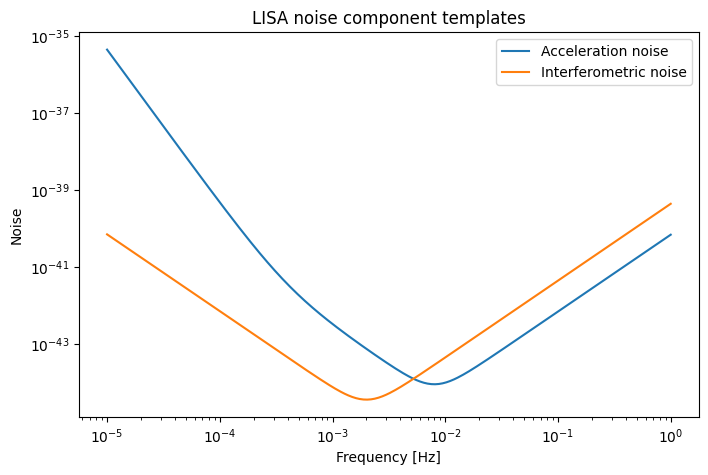

In [22]:
acc_noise = gwr.LISA_acceleration_noise(
    freqs, acc_param=1.0
)  # scales quadratically with acc_param
int_noise = gwr.LISA_interferometric_noise(
    freqs, inter_param=1.0
)  # scales quadratically with inter_param
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/acc_noise.npy", np.array(acc_noise))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/int_noise.npy", np.array(int_noise))

fig = plt.figure(figsize=(8, 5))
plt.loglog(freqs, acc_noise, label="Acceleration noise")
plt.loglog(freqs, int_noise, label="Interferometric noise")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.legend()
plt.title("LISA noise component templates")

Single link TM noise matrix shape: (100, 300, 6, 6) [time, freq, arms, arms]
TM parameters shape: (100, 6)


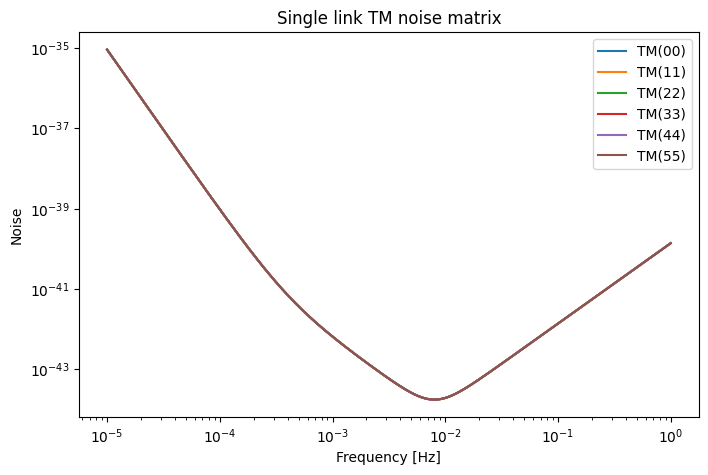

In [23]:
# Compute the single link TM noise matrix
TM_params = jnp.ones(
    shape=(100, 6)
)  # Should be shape [time, 6] or [1, 6] (for each of the arms)
tm_noise_single_link = gwr.single_link_TM_acceleration_noise_variance(
    freqs,
    TM_acceleration_parameters=TM_params,  # Should be length 6 (for each of the arms)
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/tm_noise_single_link.npy",
        np.array(tm_noise_single_link),
    )
print(
    "Single link TM noise matrix shape:",
    tm_noise_single_link.shape,
    "[time, freq, arms, arms]",
)
fig = plt.figure(figsize=(8, 5))
for i in range(6):
    plt.loglog(
        freqs, tm_noise_single_link[0, :, i, i], label=f"TM({i}{i})"
    )  # Off-diagonal elements are zero
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.title("Single link TM noise matrix")
print("TM parameters shape:", TM_params.shape)

Single link OMS noise matrix shape: (1, 300, 6, 6) [time, freq, arms, arms]
OMS parameters: [[1. 1. 1. 1. 1. 1.]]


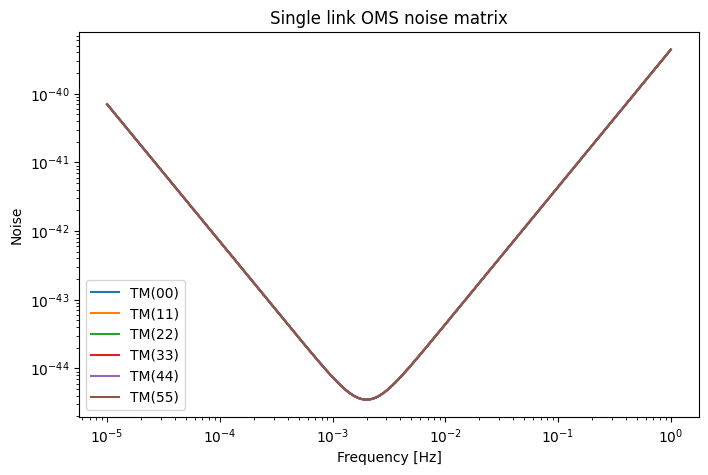

In [24]:
# Compute the single link OMS noise matrix
OMS_params = jnp.ones(
    shape=(1, 6)
)  # Should be shape [time, 6] or [1, 6] (for each of the arms)
oms_noise_single_link = gwr.single_link_OMS_noise_variance(
    freqs,
    OMS_parameters=OMS_params,  # Should be length 6 (for each of the arms)
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "Single link OMS noise matrix shape:",
    oms_noise_single_link.shape,
    "[time, freq, arms, arms]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/oms_noise_single_link.npy",
        np.array(oms_noise_single_link),
    )
fig = plt.figure(figsize=(8, 5))
for i in range(6):
    plt.loglog(
        freqs, oms_noise_single_link[0, :, i, i], label=f"TM({i}{i})"
    )  # Off-diagonal elements are zero
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.title("Single link OMS noise matrix")
print("OMS parameters:", OMS_params)

TM TDI projection shape: (100, 300, 3, 3) [time, freq, tdi, tdi]
OMS TDI projection shape: (100, 300, 3, 3) [time, freq, tdi, tdi]


Text(0.5, 1.0, 'TDI projection')

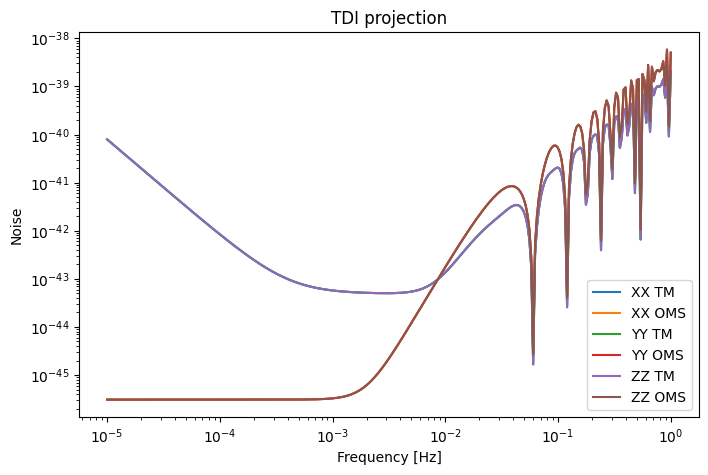

In [25]:
# Build the TDI Projections (default is the XYZ basis, change the number for the others)
TM_tdi_projection = gwr.tdi_projection(
    TDI_idx=TDI_idx,
    single_link_mat=tm_noise_single_link,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "TM TDI projection shape:",
    TM_tdi_projection.shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tm_tdi_projection.npy", np.array(TM_tdi_projection))
OMS_tdi_projection = gwr.tdi_projection(
    TDI_idx=TDI_idx,
    single_link_mat=oms_noise_single_link,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "OMS TDI projection shape:",
    OMS_tdi_projection.shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/oms_tdi_projection.npy", np.array(OMS_tdi_projection))

fig = plt.figure(figsize=(8, 5))

for i in range(3):
    plt.loglog(freqs, TM_tdi_projection[0, :, i, i], label=gwr.TDI_labels[TDI_combination][i] + " TM")
    plt.loglog(freqs, OMS_tdi_projection[0, :, i, i], label=gwr.TDI_labels[TDI_combination][i] + " OMS")
    
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.title("TDI projection")

Text(0.5, 1.0, 'TDI projection')

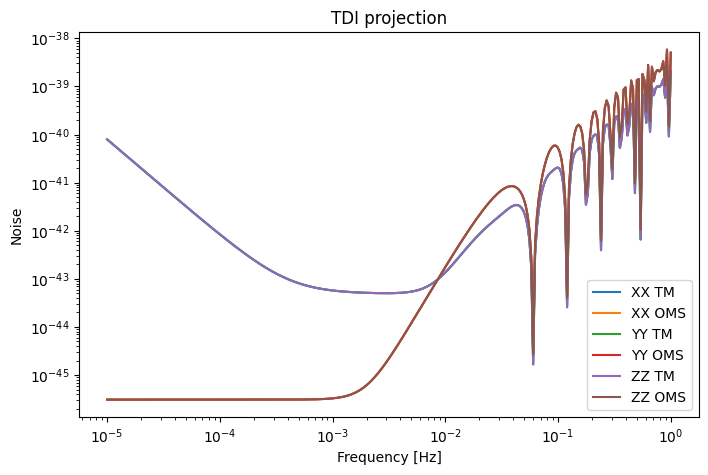

In [26]:
# The content of previous cell can be achieved in one step 
# (without previously defining the single link noise) with the following

TM_tdi_matrix = gwr.noise_TM_matrix(
    TDI_idx=TDI_idx,
    frequency=freqs,
    TM_acceleration_parameters=TM_params,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
OMS_tdi_matrix = gwr.noise_OMS_matrix(
    TDI_idx=TDI_idx,
    frequency=freqs,
    OMS_parameters=OMS_params,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tm_tdi_matrix.npy", np.array(TM_tdi_matrix))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/oms_tdi_matrix.npy", np.array(OMS_tdi_matrix))

fig = plt.figure(figsize=(8, 5))
labels = ["XX", "YY", "ZZ"]
for i in range(3):
    plt.loglog(freqs, TM_tdi_matrix[0, :, i, i], label=gwr.TDI_labels[TDI_combination][i] + " TM")
    plt.loglog(freqs, OMS_tdi_matrix[0, :, i, i], label=gwr.TDI_labels[TDI_combination][i] + " OMS")
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.title("TDI projection")

Text(0.5, 1.0, 'TDI projection')

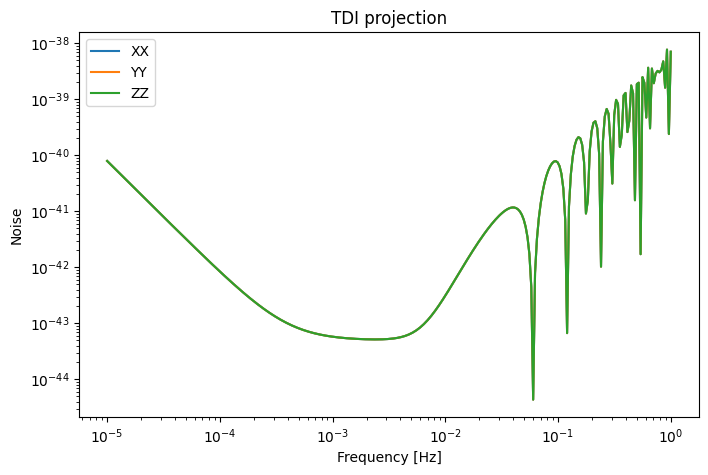

In [27]:
# Or in one combined step for TM and OMS
noise_matrix = gwr.noise_matrix(
    TDI_idx=TDI_idx,
    frequency=freqs,
    TM_acceleration_parameters=TM_params,
    OMS_parameters=OMS_params,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/noise_matrix.npy", np.array(noise_matrix))
fig = plt.figure(figsize=(8, 5))
labels = ["XX", "YY", "ZZ"]
for i in range(3):
    plt.loglog(freqs, noise_matrix[0, :, i, i], label=gwr.TDI_labels[TDI_combination][i])
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.title("TDI projection")

In [28]:
# Another example with AET
TDI_combination2 = 'AET'
TDI_idx2 = gwr.TDI_map[TDI_combination2]

TM TDI projection shape: (100, 300, 3, 3) [time, freq, tdi, tdi]
OMS TDI projection shape: (100, 300, 3, 3) [time, freq, tdi, tdi]


Text(0.5, 1.0, 'TDI projection')

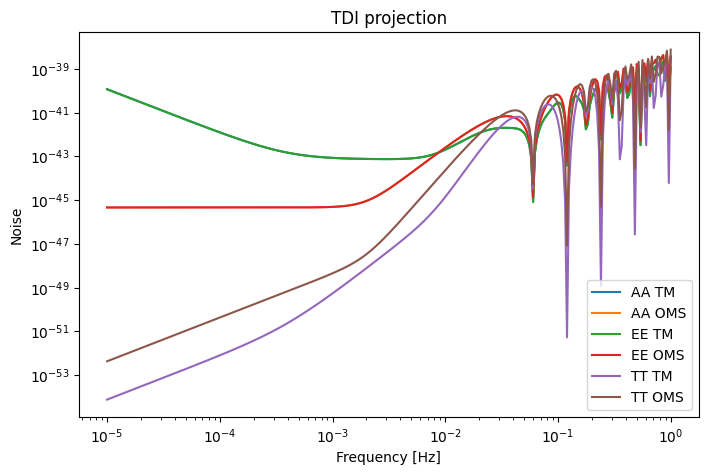

In [29]:
# TDI Projections (the default for this block is the AET basis, change it if you want)

TM_tdi_projection = gwr.tdi_projection(
    TDI_idx=TDI_idx2,
    single_link_mat=tm_noise_single_link,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "TM TDI projection shape:",
    TM_tdi_projection.shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/tm_tdi_projection_aet.npy",
        np.array(TM_tdi_projection),
    )

OMS_tdi_projection = gwr.tdi_projection(
    TDI_idx=TDI_idx2,
    single_link_mat=oms_noise_single_link,
    arms_matrix_rescaled=lisa.detector_arms(time_in_years=time_in_years)
    / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "OMS TDI projection shape:",
    OMS_tdi_projection.shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/oms_tdi_projection_aet.npy",
        np.array(OMS_tdi_projection),
    )

fig = plt.figure(figsize=(8, 5))
labels = ["AA", "EE", "TT"]
for i in range(3):
    plt.loglog(freqs, TM_tdi_projection[0, :, i, i], label=gwr.TDI_labels[TDI_combination2][i] + " TM")
    plt.loglog(freqs, OMS_tdi_projection[0, :, i, i], label=gwr.TDI_labels[TDI_combination2][i] + " OMS")
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Noise")
plt.title("TDI projection")

## Module: `single_link`

Implementation of the various helper functions to compute the single link response

In [30]:
# Compute a unit vector in the direction of theta, phi
unit_vector = gwr.unit_vec(theta, phi)

if GENERATE_TEST_DATA:
    np.save("../testing/test_data/unit_vector.npy", np.array(unit_vector))
print("unit_vector shape:", unit_vector.shape, "[xyz, pixel]")

unit_vector shape: (3, 768) [xyz, pixel]


In [31]:
# Complete an orthogonal basis for a given unit vector along theta, phi
u, v = gwr.uv_analytical(theta, phi)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/u.npy", np.array(u))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/v.npy", np.array(v))
print("u shape:", u.shape, "[pixel, xyz]")
print("v shape:", v.shape, "[pixel, xyz]")
# These can be used to compute polarization vectors
e1, e2 = gwr.polarization_vectors(u, v)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/e1.npy", np.array(e1))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/e2.npy", np.array(e2))
print("e1 shape:", e1.shape, "[pixel, xyz]")
print("e2 shape:", e2.shape, "[pixel, xyz]")
# Or polarisation tensors in some basis
e1p, e1c = gwr.polarization_tensors_PC(u, v)
e1L, e1R = gwr.polarization_tensors_LR(u, v)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/e1p.npy", np.array(e1p))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/e1c.npy", np.array(e1c))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/e1L.npy", np.array(e1L))
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/e1R.npy", np.array(e1R))
print("e1p shape:", e1p.shape, "[pixel, xyz, xyz]")
print("e1c shape:", e1c.shape, "[pixel, xyz, xyz]")
print("e1L shape:", e1L.shape, "[pixel, xyz, xyz]")
print("e1R shape:", e1R.shape, "[pixel, xyz, xyz]")

u shape: (768, 3) [pixel, xyz]
v shape: (768, 3) [pixel, xyz]
e1 shape: (768, 3) [pixel, xyz]
e2 shape: (768, 3) [pixel, xyz]
e1p shape: (768, 3, 3) [pixel, xyz, xyz]
e1c shape: (768, 3, 3) [pixel, xyz, xyz]
e1L shape: (768, 3, 3) [pixel, xyz, xyz]
e1R shape: (768, 3, 3) [pixel, xyz, xyz]


In [32]:
# There are a set of functions to compute the various quantities in the response
xi_k = gwr.single_link_static.xi_k_no_G_static(
    unit_wavevector=unit_vector,
    x_vector=lisa.x(freqs),
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/xi_k.npy", np.array(xi_k))
print("xi_k shape:", xi_k.shape, "[time, freq, arms, pixel]")

xi_k shape: (1, 300, 6, 768) [time, freq, arms, pixel]


In [33]:
# Or the exponential of the position
position_exp = gwr.position_exponential(
    positions_detector_frame_rescaled=jnp.array([[sp1, sp2, sp3]]) / lisa.armlength,
    unit_wavevector=unit_vector,
    x_vector=lisa.x(freqs),
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/position_exp.npy", np.array(position_exp))
print("position_exp shape:", position_exp.shape, "[time, freq, arms, pixel]")

# Or a geometrical factor
geomtrical_factor = gwr.geometrical_factor(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    polarization_tensor=e1L,
)
print("geomtrical_factor shape:", geomtrical_factor.shape, "[time, arms, pixel]")
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/geometrical_factor.npy", np.array(geomtrical_factor))

# Or a different version of xi_k
xi_k_Avec = gwr.xi_k_A_static(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    unit_wavevector=unit_vector,
    x_vector=lisa.x(freqs),
    geometrical=geomtrical_factor,
)
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/xi_k_Avec.npy", np.array(xi_k_Avec))
print("xi_k_Avec shape:", xi_k_Avec.shape, "[time, freq, arms, pixel]")

position_exp shape: (1, 300, 3, 768) [time, freq, arms, pixel]
geomtrical_factor shape: (1, 6, 768) [time, arms, pixel]
xi_k_Avec shape: (1, 300, 6, 768) [time, freq, arms, pixel]


single_link_response shape: (1, 300, 6, 768) [time, freq, arms, pixel]


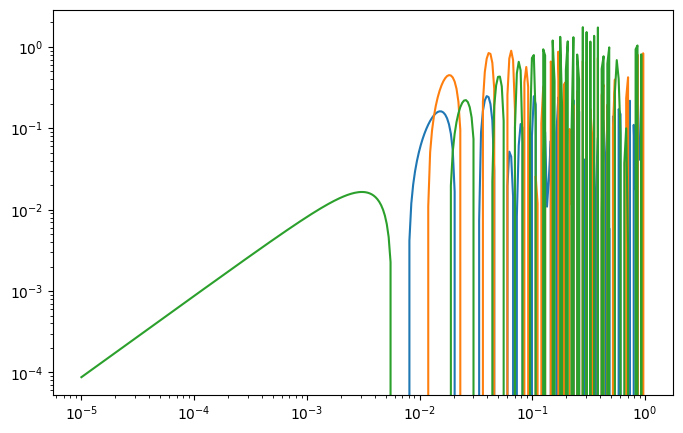

In [34]:
# With these we can compute the single link response
geomtrical_factor = gwr.geometrical_factor(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    polarization_tensor=e1L,
)
xi_k_A_static = gwr.xi_k_A_static(
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    unit_wavevector=unit_vector,
    x_vector=lisa.x(freqs),
    geometrical=geomtrical_factor,
)
single_link_response = gwr.single_link_response_static(
    positions_rescaled=lisa.vertex_positions(0.0) / lisa.armlength,
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    wavevector=unit_vector,
    x_vector=lisa.x(freqs),
    xi_k_A_static=xi_k_A_static,
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/single_link_response.npy",
        np.array(single_link_response),
    )
print(
    "single_link_response shape:",
    single_link_response.shape,
    "[time, freq, arms, pixel]",
)
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(freqs, single_link_response[0, :, i, 0])
plt.show()

In [35]:
# Given a TDI matrix, can then project any single link response onto the correct TDI basis
tdi_projection = gwr.build_tdi(
    TDI_idx=gwr.TDI_map[TDI_combination], 
    single_link=single_link_response,
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print("tdi_projection shape:", tdi_projection.shape, "[time, freq, tdi, pixels]")
if GENERATE_TEST_DATA:
    np.save("../testing/test_data/tdi_projection_"+TDI_combination+".npy", np.array(tdi_projection))

tdi_projection shape: (1, 300, 3, 768) [time, freq, tdi, pixels]


linear_response_tdi shape: (1, 300, 3, 768) [time, freq, tdi, pixels]


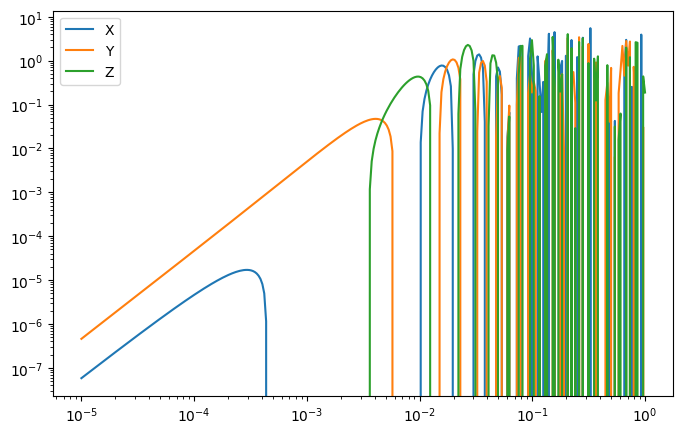

In [36]:
# Ths can be used to compute the linear angular response in the TDI basis
linear_response_tdi = gwr.linear_response_angular(
    TDI_idx=TDI_idx,
    single_link=single_link_response,
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "linear_response_tdi shape:",
    linear_response_tdi.shape,
    "[time, freq, tdi, pixels]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/linear_response_tdi.npy",
        np.array(linear_response_tdi),
    )
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(freqs, linear_response_tdi[0, :, i, 0], label=gwr.TDI_labels[TDI_combination][i][0])
plt.legend()

quadratic_response_angular shape: (1, 300, 3, 3, 768) [time, freq, tdi, tdi, pixels]


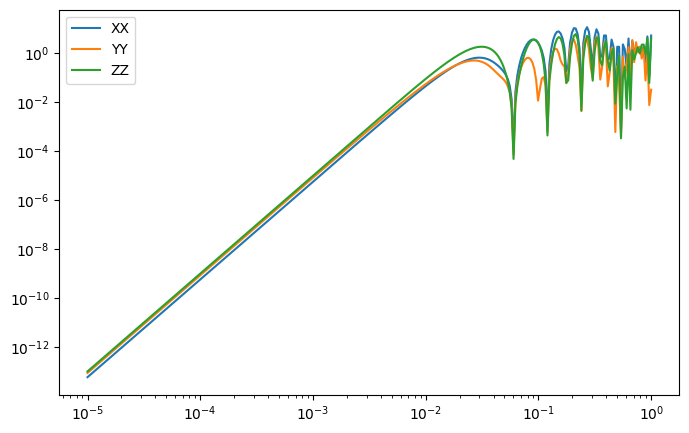

In [37]:
# Or the quadratic response (the plot is for 1 specific pixel/angular direction)
quadratic_response_angular = gwr.quadratic_response_angular(
    TDI_idx=TDI_idx,
    single_link=single_link_response,
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
print(
    "quadratic_response_angular shape:",
    quadratic_response_angular.shape,
    "[time, freq, tdi, tdi, pixels]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_response_angular.npy",
        np.array(quadratic_response_angular),
    )
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(
        freqs,
        quadratic_response_angular[0, :, i, i, 0],
        label=gwr.TDI_labels[TDI_combination][i],
    )
plt.legend()

quadratic_response_integrated shape: (1, 300, 3, 3) [time, freq, tdi, tdi]


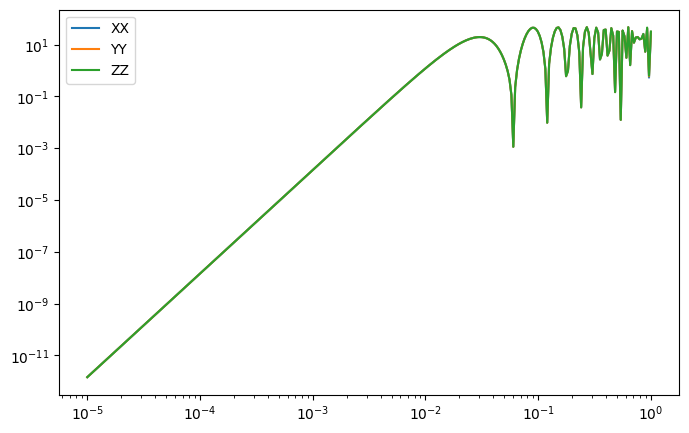

In [38]:
# This angular response can be used to compute the integrated response averaged over the sky
quadratic_response_integrated = gwr.quadratic_response_integrated(quadratic_response_angular)
print(
    "quadratic_response_integrated shape:",
    quadratic_response_integrated.shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_response_integrated.npy",
        np.array(quadratic_response_integrated),
    )
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(freqs, quadratic_response_integrated[0, :, i, i], label=gwr.TDI_labels[TDI_combination][i])
plt.legend()

quadratic_integrated_response shape: (1, 300, 3, 3) [time, freq, tdi, tdi]


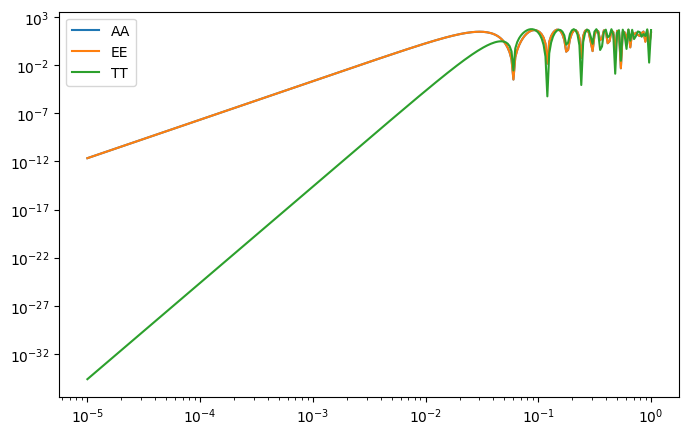

In [39]:
# Or in the AET basis
quadratic_response_angular_AET = gwr.quadratic_response_angular(
    TDI_idx=1,  # AET basis
    single_link=single_link_response,
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
)
quadratic_integrated_response = gwr.quadratic_response_integrated(quadratic_response_angular_AET)
print(
    "quadratic_integrated_response shape:",
    quadratic_integrated_response.shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_integrated_response_AET.npy",
        np.array(quadratic_integrated_response),
    )
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(freqs, quadratic_integrated_response[0, :, i, i], label=gwr.TDI_labels["AET"][i])
plt.legend()

## Module: `response`

Implements a `Response` class for computing the angular and integrated response in a given detector

In [40]:
# Set up the response object
response = lisa.response

In [41]:
# Angular response
pixel = gwr.Pixel()
theta, phi = jnp.asarray(pixel.theta_pixel), jnp.asarray(pixel.phi_pixel)
single_link_response = response.get_single_link_response_fd(
    lisa,
    times_in_years=jnp.array([0.0]),
    theta_array=theta,
    phi_array=phi,
    frequency_array=freqs,
    polarization="LR",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/single_link_response_L.npy",
        np.array(single_link_response["L"]),
    )
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/single_link_response_R.npy",
        np.array(single_link_response["R"]),
    )
print(
    "single_link_response shape:",
    single_link_response["L"].shape,
    "[time, freq, arms, pixel]",
)

single_link_response shape: (1, 300, 6, 768) [time, freq, arms, pixel]


In [42]:
# Linear integrand response (still using the TDI_combination specified above)

linear_integrand = response.get_linear_integrand_fd(
    lisa,
    times_in_years=jnp.array([0.0]),
    theta_array=theta,
    phi_array=phi,
    frequency_array=freqs,
    combination=TDI_combination,
    polarization="LR",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/linear_integrand_L.npy",
        np.array(linear_integrand["L"]),
    )
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/linear_integrand_R.npy",
        np.array(linear_integrand["R"]),
    )
print(
    "linear_integrand shape:",
    linear_integrand["L"].shape,
    "[time, freq, arms, pixel]",
)

linear_integrand shape: (1, 300, 3, 768) [time, freq, arms, pixel]


In [43]:
# Compute the full integrated response (still using the TDI_combination specified above)

response.compute_detector(
    lisa,
    times_in_years=jnp.array([0.0]),
    theta_array=theta,
    phi_array=phi,
    frequency_array=freqs,
    combination=TDI_combination,
    polarization="LR",
)
print(
    "response shape:",
    response.quadratic_integrated[TDI_combination]["LL"].shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_response_"+TDI_combination+"_LL.npy",
        np.array(response.quadratic_integrated[TDI_combination]["LL"]),
    )
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_response_"+TDI_combination+"_RR.npy",
        np.array(response.quadratic_integrated[TDI_combination]["RR"]),
    )

response shape: (1, 300, 3, 3) [time, freq, tdi, tdi]


Text(0.5, 1.0, 'Integrated response')

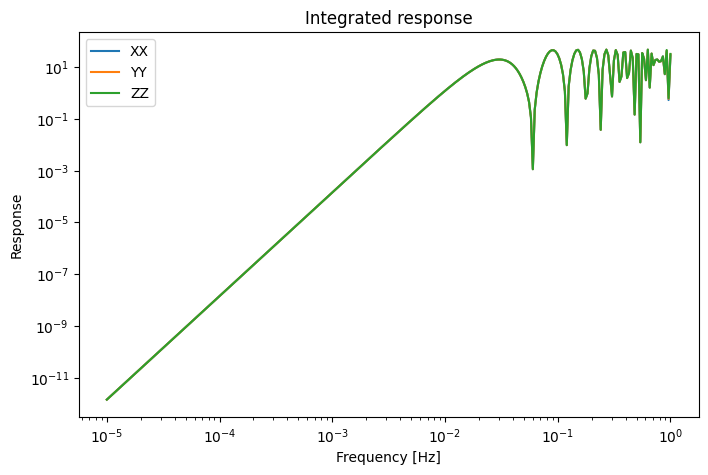

In [44]:
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(freqs, response.quadratic_integrated[TDI_combination]["LL"][0, :, i, i], label=gwr.TDI_labels[TDI_combination][i])
plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel("Response")
plt.title("Integrated response")

In [45]:
# Compute the full integrated response in AET basis 
response.compute_detector(
    lisa,
    times_in_years=jnp.array([0.0]),
    theta_array=theta,
    phi_array=phi,
    frequency_array=freqs,
    combination="AET",
    polarization="LR",
)
print(
    "response shape:",
    response.quadratic_integrated["AET"]["LL"].shape,
    "[time, freq, tdi, tdi]",
)
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_response_AET_LL.npy",
        np.array(response.quadratic_integrated["AET"]["LL"]),
    )
if GENERATE_TEST_DATA:
    np.save(
        "../testing/test_data/quadratic_response_AET_RR.npy",
        np.array(response.quadratic_integrated["AET"]["RR"]),
    )

response shape: (1, 300, 3, 3) [time, freq, tdi, tdi]


Text(0.5, 1.0, 'Integrated response')

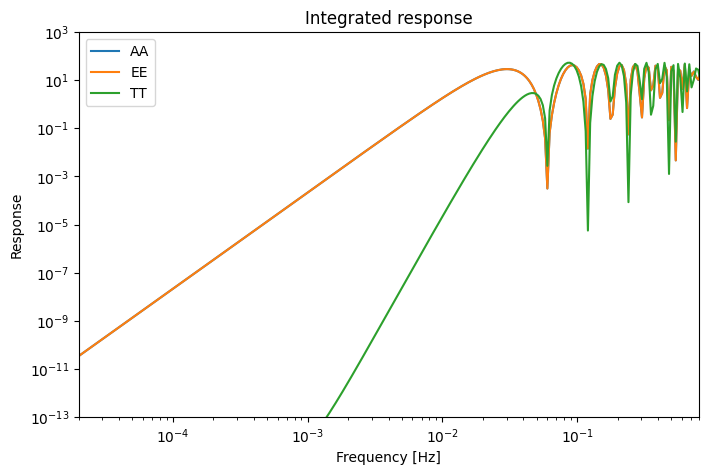

In [46]:
fig = plt.figure(figsize=(8, 5))
for i in range(3):
    plt.loglog(freqs, response.quadratic_integrated["AET"]["LL"][0, :, i, i], label=gwr.TDI_labels["AET"][i])
plt.legend()
plt.xlim(2e-5,8e-1)
plt.ylim(1e-13,100e1)
plt.xlabel("Frequency [Hz]")
plt.ylabel("Response")
plt.title("Integrated response")

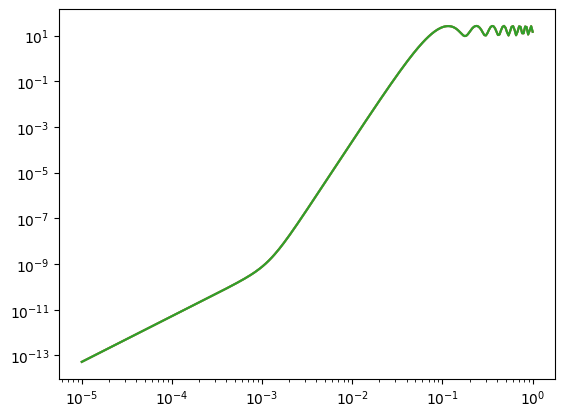

In [47]:
# As an example, let's check that, modulo some TDI factors, all null variables are the same for equal arms

AET = np.mean(gwr.quadratic_response_angular(
    TDI_idx=gwr.TDI_map['AET'],  # AET basis
    single_link=single_link_response['L'],
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
), axis=-1) * 4 * np.pi

AE_zeta = np.mean(gwr.quadratic_response_angular(
    TDI_idx=gwr.TDI_map['AE_zeta'],  # AE_zeta basis
    single_link=single_link_response['L'],
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
), axis=-1) * 4 * np.pi

AET_Sagnac = np.mean(gwr.quadratic_response_angular(
    TDI_idx=gwr.TDI_map['AET_Sagnac'],  # AET_Sagnac basis
    single_link=single_link_response['L'],
    arms_matrix_rescaled=lisa.detector_arms(0.0) / lisa.armlength,
    x_vector=lisa.x(freqs),
), axis=-1) * 4 * np.pi


plt.loglog(freqs, AET[0,:,2,2] / np.sin(lisa.x(freqs))**2 / (1 - np.cos(lisa.x(freqs))) / 8 * 3 )
plt.loglog(freqs, AE_zeta[0,:,2,2])
plt.loglog(freqs, AET_Sagnac[0,:,2,2]  / (1 + 2 *np.cos(lisa.x(freqs)))**2 * 3 )

Compute maps for different frequencies and times

In [48]:
pixel_class.change_NSIDE(NSIDE=32)
nside = pixel.NSIDE
npix = jhp.nside2npix(nside)

# Build a Healpix map for each time and frequency and display it with mollview.
ntimes = 50
times = jnp.linspace(0.0, 1.0, ntimes)
freq_values = jnp.array([1e-4, 3e-2, 1e-1])
n_freqs = len(freq_values)

single_link = response.get_single_link_response_fd(
    lisa,
    times_in_years=times,
    theta_array=pixel_class.theta_pixel,
    phi_array=pixel_class.phi_pixel,
    frequency_array=freq_values,
    polarization="LR",
)

angular_response = gwr.quadratic_response_angular(
    TDI_idx=gwr.TDI_map[TDI_combination],
    single_link=single_link["L"],
    arms_matrix_rescaled=lisa.detector_arms(times) / lisa.armlength,
    x_vector=lisa.x(freq_values),
)[:, :, 0, 0, :]


pixel_indices = np.asarray(jhp.ang2pix(nside, pixel_class.theta_pixel, pixel_class.phi_pixel), dtype=int)

maps = np.zeros((len(times), len(freq_values), npix))
for t_idx in range(len(times)):
    for f_idx in range(len(freq_values)):
        pixel_map = np.zeros(npix)
        pixel_map[pixel_indices] = angular_response[t_idx, f_idx]
        maps[t_idx, f_idx] = pixel_map / np.max(pixel_map)

Create a nice gif showing how the response changes on the sky at different freqs

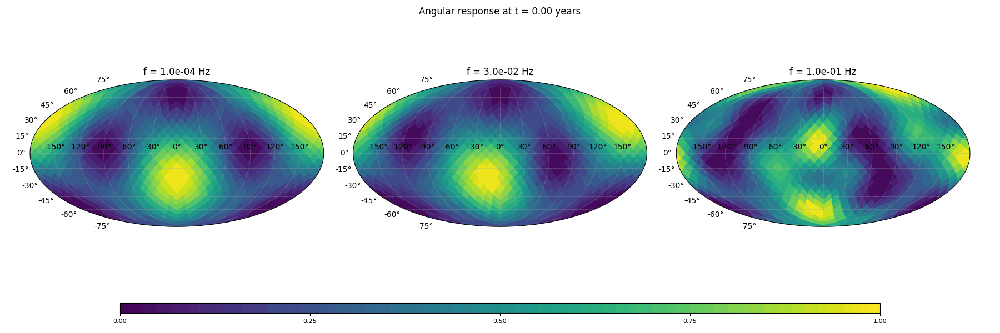

In [49]:
fig, axes = plt.subplots(
    1,
    n_freqs,
    figsize=(18, 6),
    subplot_kw={"projection": "mollweide"},
)

fig.subplots_adjust(left=0.03, right=0.97, bottom=0.18, top=0.9, wspace=0.1)

cax = fig.add_axes([0.12, 0.06, 0.76, 0.03])
sm = plt.cm.ScalarMappable(norm=plt.Normalize(0.0, 1.0), cmap="viridis")
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="horizontal")
cbar.set_ticks(np.linspace(0.0, 1.0, 5))
cbar.ax.tick_params(labelsize=8)


def draw_frame(frame_idx):
    for ax, freq_value, panel_idx in zip(axes, freq_values, range(n_freqs)):
        ax.clear()
        values = maps[frame_idx, panel_idx][pix_grid]
        if values.ndim != 2:
            values = values.reshape(theta_grid.shape)
        ax.contourf(lon_grid, lat_grid, values, levels=20, cmap="viridis")
        ax.set_title(f"f = {freq_value:.1e} Hz")
        ax.grid(True, alpha=0.25)
    fig.suptitle(f"Angular response at t = {times[frame_idx]:.2f} years")

# Initial frame
draw_frame(0)


def update(frame):
    draw_frame(frame)
    return tuple(axes)

ani = animation.FuncAnimation(fig, update, frames=ntimes, interval=200, blit=False)
gif_path = Path("tutorial_LISA_output/tutorial_LISA_angular_response.gif")
ani.save(gif_path, writer="pillow", fps=1)
plt.close(fig)

display(Image(filename=str(gif_path)))

Same as above but for the integrated response to show time variations

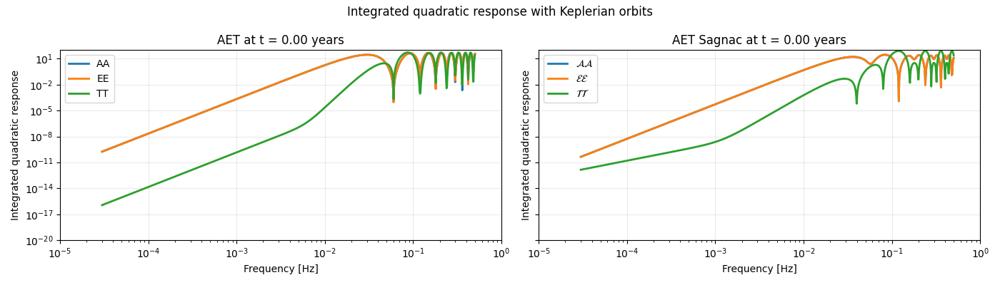

In [50]:
pixel_class.change_NSIDE(NSIDE=8)
nside = pixel.NSIDE
npix = jhp.nside2npix(nside)

# Build a second animation for the sky-integrated quadratic response using Keplerian orbits.
# Use a non-default clocking angle so the triangle is visibly non-equilateral and the arm lengths vary over time.
keplerian_lisa = gwr.LISA(
    orbit_approximant="keplerian",
    keplerian_tilt_parameter=0.0,
    keplerian_initial_clocking_angle=1.0,
    keplerian_chirality=1.0,
)
keplerian_response = keplerian_lisa.response

freq_values = jnp.geomspace(3e-5, 5e-1, 1000)

single_link = keplerian_response.get_single_link_response_fd(
    keplerian_lisa,
    times_in_years=times,
    theta_array=pixel_class.theta_pixel,
    phi_array=pixel_class.phi_pixel,
    frequency_array=freq_values,
    polarization="LR",
)


def integrated_response_for(combo_name):
    quadratic = gwr.quadratic_response_angular(
        TDI_idx=gwr.TDI_map[combo_name],
        single_link=single_link["L"],
        arms_matrix_rescaled=keplerian_lisa.detector_arms(times) / keplerian_lisa.armlength,
        x_vector=keplerian_lisa.x(freq_values),
    )
    integrated = gwr.quadratic_response_integrated(quadratic)
    return np.asarray(np.real(np.stack([integrated[..., i, i] for i in range(3)], axis=0)))

response_aet = integrated_response_for("AET")
response_sagnac = integrated_response_for("AET_Sagnac")

response_aet = np.maximum(np.abs(response_aet), 1e-30)
response_sagnac = np.maximum(np.abs(response_sagnac), 1e-30)

fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=True)
fig.suptitle("Integrated quadratic response with Keplerian orbits")

panel_labels = [gwr.TDI_labels["AET"], gwr.TDI_labels["AET_Sagnac"]]
panel_signals = [response_aet, response_sagnac]

lines = []
for ax, title, signal, labels in zip(axes, ["AET", "AET Sagnac"], panel_signals, panel_labels):
    panel_lines = []
    for channel_idx, channel_label in enumerate(labels):
        line, = ax.loglog([], [], lw=2, label=channel_label)
        panel_lines.append(line)
    lines.append(panel_lines)
    ax.set_title(title)
    ax.set_xlabel("Frequency [Hz]")
    ax.set_ylabel("Integrated quadratic response")
    ax.set_xlim(freq_values[0], freq_values[-1])
    ymax = np.max(signal)
    ax.set_ylim(1e-20, 100)
    ax.set_xlim(1e-5, 1.0)
    ax.grid(alpha=0.25)


def draw_frame(frame_idx):
    for ax, panel_lines, signal, labels in zip(axes, lines, panel_signals, panel_labels):
        for line, channel_idx, channel_label in zip(panel_lines, range(3), labels):
            line.set_data(freq_values, signal[channel_idx, frame_idx])
        ax.relim()
        ax.autoscale_view()
        ax.legend(loc="best")
        ax.set_title(f"{ax.get_title().split(' at ')[0]} at t = {times[frame_idx]:.2f} years")

# Initial frame
draw_frame(0)
fig.tight_layout()


def update(frame):
    draw_frame(frame)
    return tuple(line for panel in lines for line in panel)

ani = animation.FuncAnimation(fig, update, frames=len(times), interval=700, blit=False)
gif_path = Path("tutorial_LISA_output/tutorial_LISA_keplerian_integrated_response.gif")
ani.save(gif_path, writer="pillow", fps=2)
plt.close(fig)

display(Image(filename=str(gif_path)))